In [1]:
import warnings
warnings.filterwarnings("ignore")

#print("완료!")

In [2]:
import numpy as np
import tensorflow as tf
print(tf.__version__)

2.6.0


# 모델 학습을 위한 데이터셋(dataset) 준비하기

In [3]:
import tensorflow_datasets as tfds

tfds.__version__

'4.4.0'

# tensorflow_datasets에 관한 세부 내용 참조링크

https://www.tensorflow.org/datasets/catalog/tf_flowers

* 참조할 데이타셋 링크 : http://download.tensorflow.org/example_images/flower_photos.tgz

In [4]:
#!mkdir -p ~/aiffel/tf_flowers
#!ln -s ~/data/* ~/aiffel/tf_flowers/

In [5]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(  #데이터셋을 로드
    name='tf_flowers',                                      #사용 데이터셋 이름
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],   #데이터셋을 훈련(기차), 검증(검증), 테스트(테스트)로 설정
    data_dir='~/aiffel/tf_flowers/',                        #데이터셋을 저장하거나 참조할 위치
    download=False,                                          #추가 다운로드를 방지
    with_info=True,                                          #데이터셋의 데이터(설명,좌우 등)
    as_supervised=True,                                      #(image, label) 형식으로 데이터를 반환
)

In [6]:
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


* (image, label) -> ((None, None, 3), ()) : image의 shape/label의 shape
* image : (height, width, channel), 정해져 있지 않은 사이즈이기 때문에 None으로 표시
* 채널의 수 : 3 (RGB)

In [7]:
# 분할된 데이터의 비율 확인
train_count = len(raw_train)
val_count = len(raw_validation)
test_count = len(raw_test)
total_count = train_count+val_count+test_count

print(f"전체 데이터 개수: {total_count}")
print(f"훈련 세트 개수: {train_count} ({train_count/total_count*100:.2f}%)")
print(f"검증 세트 개수: {val_count} ({val_count/total_count*100:.2f}%)")
print(f"테스트 세트 개수: {test_count} ({test_count/total_count*100:.2f}%)")

전체 데이터 개수: 3670
훈련 세트 개수: 2936 (80.00%)
검증 세트 개수: 367 (10.00%)
테스트 세트 개수: 367 (10.00%)


In [8]:
num_classes = metadata.features['label'].num_classes
print(num_classes)

5


In [9]:
"""
import pathlib

data_dir_org = pathlib.Path('/aiffel/.keras/datasets/flower_photos')

image_daisy_count = len(list(data_dir_org.glob('daisy/*.jpg')))
print('image_daisy_count: ',image_daisy_count)

image_dandelion_count = len(list(data_dir_org.glob('dandelion/*.jpg')))
print('image_dandelion_count: ', image_dandelion_count)

image_roses_count = len(list(data_dir_org.glob('roses/*.jpg')))
print('image_roses_count: ',image_roses_count)

image_sunflowers_count = len(list(data_dir_org.glob('sunflowers/*.jpg')))
print('image_sunflowers_count: ', image_sunflowers_count)

image_tulips_count = len(list(data_dir_org.glob('tulips/*.jpg')))
print('image_tulips_count: ', image_tulips_count)

# 사진의 사본 전체건수 확인
image_count = len(list(data_dir_org.glob('*/*.jpg')))
print('image_count: ', image_count)
"""

"\nimport pathlib\n\ndata_dir_org = pathlib.Path('/aiffel/.keras/datasets/flower_photos')\n\nimage_daisy_count = len(list(data_dir_org.glob('daisy/*.jpg')))\nprint('image_daisy_count: ',image_daisy_count)\n\nimage_dandelion_count = len(list(data_dir_org.glob('dandelion/*.jpg')))\nprint('image_dandelion_count: ', image_dandelion_count)\n\nimage_roses_count = len(list(data_dir_org.glob('roses/*.jpg')))\nprint('image_roses_count: ',image_roses_count)\n\nimage_sunflowers_count = len(list(data_dir_org.glob('sunflowers/*.jpg')))\nprint('image_sunflowers_count: ', image_sunflowers_count)\n\nimage_tulips_count = len(list(data_dir_org.glob('tulips/*.jpg')))\nprint('image_tulips_count: ', image_tulips_count)\n\n# 사진의 사본 전체건수 확인\nimage_count = len(list(data_dir_org.glob('*/*.jpg')))\nprint('image_count: ', image_count)\n"

# 데이터 시각화를 통해 확인하고, 모델에 입력할 수 있는 형태로 전처리하기

In [10]:
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'


* raw_train 안에 있는 데이터를 확인, tf.data.Dataset에서 제공하는 take라는 함수를 사용
 - 기능 : 인수로 받은 개수만큼의 데이터를 추출하여 새로운 데이터셋 인스턴스를 생성하여 리턴하는 함수

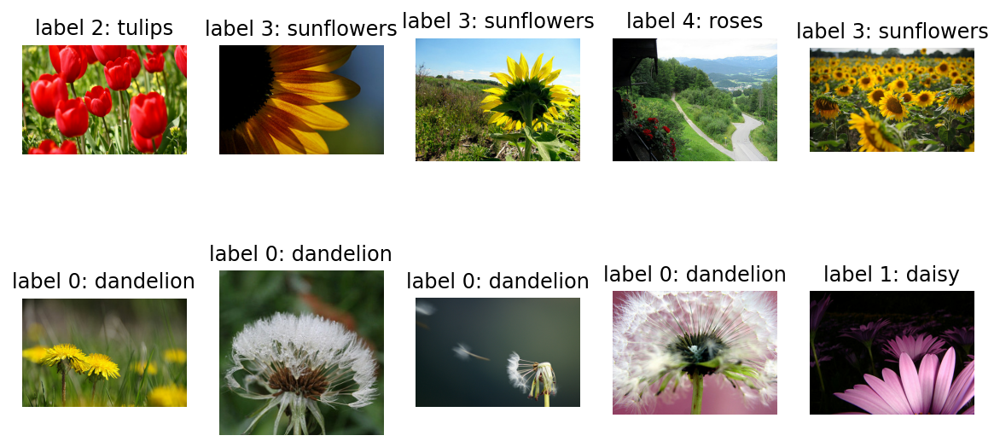

In [11]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

* label 0: dandelion(민들레), label 1:daisy(데이지), 
  label 2:tulips(튤립), label 3:sunflowers(해바라기), label 4:roses(장미)
* 이미지를 같은 포맷으로 통일 : format_example()

* 타입캐스팅(Type Casting) : 형변환이라고도 불리는 타입개스팅은 다른 데이터 타입으로 형(타입)을 바꿔주는 것을 의미, float()

In [12]:
# 아래 코드는 이미지의 사이즈를 180x180 픽셀로 통일시킬 뿐만 아니라, 
# 각 픽셀값의 scale을 수정해주는 역할도 합니다.

IMG_SIZE = 180 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전. 입력된 이미지를 tf.float32유형으로 변환
    image = (image/127.5) - 1 # 픽셀값의 scale 수정, 이미지는 보통 0에서 255사이의 가치로 표현, 이 배열은 배열 값을 [-1, 1]범위로 스케일링
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE)) #이미지를 IMG_SIZE x IMG_SIZE크기로 변환
    return image, label   #처리된 이미지와 해당하는 label 반환
 
#print("슝~")

* image = (image / 127.5) - 1
 - 이미지는 보통 0에서 255사이의 가치로 표현됩니다.
 - 이 배열은 배열 값을 [-1, 1]범위로 스케일링합니다:
    * 0 → -1
    * 127.5 → 0
    * 255 → 1
 - 신경망의 서서히 학습을 위해 가치의 범위를 조정하는 과정입니다.
    * 0~255 사이의 값들을 그 중간값인 127.5로 나누고 1을 뺐으므로, -1 ~ 1 사이의 실수값이 된다.


In [13]:
#데이타셋 이미지의 크기를 (180, 180, 3)으로 통일
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset shapes: ((180, 180, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((180, 180, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((180, 180, 3), ()), types: (tf.float32, tf.int64)>


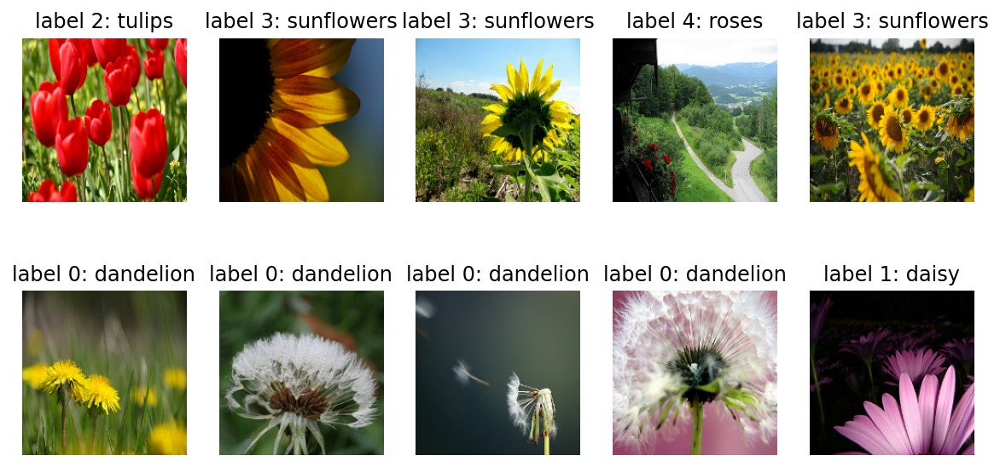

In [14]:
# matplotlib으로 이미지를 시각화 할 경우에는 모든 픽셀값이 양수여야 하므로, 
# -1 ~ 1 사이의 픽셀값을 1을 더한 후 2로 나눠서 0~1 사이의 값으로 변환하였다 ( => image = (image + 1) / 2 )

plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

# 텐서플로우를 활용해 모델 구조 설계하기

In [15]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

#print("슝~")

In [16]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(180, 180, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=5, activation='softmax')
])

model.summary()  #모델의 전체 구조표시

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 180, 180, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 90, 90, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 90, 90, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 45, 45, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 45, 45, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 22, 22, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 30976)             0

* shape: (None, height, width, channel) 
* 첫 번째 차원은 데이터의 개수 : None
* feature map
* CNN(Convolutional Neural Net)

* 모델에서 flatten 레이어를 통과한다는 것도 위와 같이 모든 숫자를 일렬로 펼쳐놓는 것 과 같습니다.
* 결과 : 
   - 딥러닝 모델은 (180, 180, 3) 크기의 3차원 이미지를 입력받아 여러 레이어를 거치며 형태를 바꾸다가 
     최종적으로는 몇 개의 숫자를 출력해내는 함수라고 할 수 있습니다.

# 모델 compile 완료 후 학습시키기

 * learning_rate : 학습률, 0.0001로 설정
 * 모델을 compile 하여 학습할 수 있는 형태로 변환
 
 * optimizer : 학습을 어떤 방식으로 시킬것인지 결정, 어떻게 최적화시킬 것인지를 결정하기 때문에 최적화 함수라고도 한다
 * loss : 모델이 학습해나가야 하는 방향을 결정
           ex) label 0: dandelion(민들레), label 1:daisy(데이지), 
               label 2:tulips(튤립), label 3:sunflowers(해바라기), label 4:roses(장미)
 * metrics : 모델의 성능을 평가하는 척도
             성능을 평가할 수 있는 지표는 정확도(accuracy), 정밀도(precision), 재현율(recall)등이 있음.

In [17]:
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

#print("슝~")

In [18]:
# 모델을 학습시킬 데이터를 준비

BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000
#print("슝~")

In [19]:
# BATCH_SIZE에 따라 32개의 데이터를 랜덤으로 뿌려줄 3개의 배치를 생성

train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)  #모델이 끊임없이 학습될 수 있도록 전체 데이터에서 32개를 랜덤뽑기 
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

#print("슝~")

In [20]:
for image_batch, label_batch in train_batches.take(1):
    break

#image_batch의 shape는 [32, 180, 180, 3], label_batch의 shape는 [32]
image_batch.shape, label_batch.shape

(TensorShape([32, 180, 180, 3]), TensorShape([32]))

# 초기 모델의 성능 확인

In [21]:
validation_steps = 5
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))  #얼마나 모델이 틀렸는지(손실), 낮을수록 좋은 것
print("initial accuracy: {:.2f}".format(accuracy0))

5/5 [==============================] - 3s 20ms/step - loss: 1.6380 - accuracy: 0.1437
initial loss: 1.64
initial accuracy: 0.14


# 모델학습

In [22]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
92/92 [==============================] - 7s 49ms/step - loss: 1.3052 - accuracy: 0.4503 - val_loss: 1.1419 - val_accuracy: 0.4986
Epoch 2/10
92/92 [==============================] - 4s 34ms/step - loss: 1.0277 - accuracy: 0.5875 - val_loss: 1.0744 - val_accuracy: 0.5913
Epoch 3/10
92/92 [==============================] - 4s 34ms/step - loss: 0.8940 - accuracy: 0.6625 - val_loss: 1.2391 - val_accuracy: 0.5232
Epoch 4/10
92/92 [==============================] - 4s 34ms/step - loss: 0.7830 - accuracy: 0.7010 - val_loss: 1.0377 - val_accuracy: 0.5940
Epoch 5/10
92/92 [==============================] - 4s 34ms/step - loss: 0.6727 - accuracy: 0.7486 - val_loss: 0.9546 - val_accuracy: 0.6458
Epoch 6/10
92/92 [==============================] - 4s 34ms/step - loss: 0.5821 - accuracy: 0.8018 - val_loss: 0.9576 - val_accuracy: 0.6294
Epoch 7/10
92/92 [==============================] - 4s 35ms/step - loss: 0.5064 - accuracy: 0.8239 - val_loss: 1.2212 - val_accuracy: 0.5695
Epoch 8/10
92

# 모델 학습곡선 확인 및 예측 결과 시각화하기

* accuracy는 훈련 데이터셋에 대한 정확도, val_accuracy는 검증 데이터셋에 대한 정확도

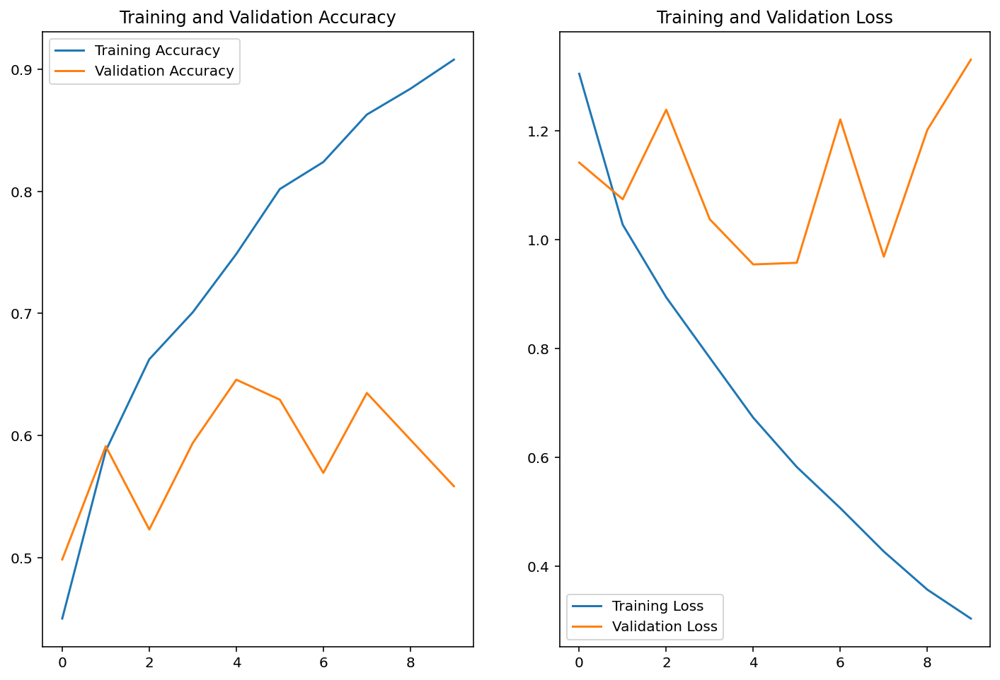

In [23]:
acc = history.history['accuracy']  #학습정확도
val_acc = history.history['val_accuracy']  #검증정확도

loss=history.history['loss']  #학습손실율
val_loss=history.history['val_loss']  #검증손실율

epochs_range = range(EPOCHS)  #EPOCHS = 10

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)  #1행2열중 1열의 그림
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')  #학습/검증 정확도

plt.subplot(1, 2, 2) #1행2열중 2열의 그림
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')  #학습/건증의 손실율
plt.show()

In [24]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

array([[7.23390331e-05, 4.67265709e-05, 9.90164340e-01, 5.18433331e-03,
        4.53221286e-03],
       [7.20999897e-01, 2.35974446e-01, 4.17583957e-02, 8.75579644e-05,
        1.17964065e-03],
       [6.41502500e-01, 1.21029112e-02, 3.28307867e-01, 1.77786853e-02,
        3.08071554e-04],
       [1.52250621e-02, 1.68004766e-01, 7.93583274e-01, 1.01725280e-03,
        2.21696105e-02],
       [7.16441453e-01, 5.24459481e-02, 2.03554288e-01, 7.41700409e-03,
        2.01412812e-02],
       [6.83210343e-02, 3.25062834e-02, 8.54360461e-01, 2.72818860e-02,
        1.75304208e-02],
       [2.17500456e-05, 3.81918740e-03, 9.94929314e-01, 1.34021466e-04,
        1.09583256e-03],
       [2.57699434e-02, 4.54538912e-02, 8.30410302e-01, 1.74517334e-02,
        8.09142217e-02],
       [5.84293306e-02, 7.03586120e-05, 3.26132774e-01, 6.14634633e-01,
        7.32860644e-04],
       [9.91923511e-01, 4.74796956e-03, 2.97898892e-03, 8.66930204e-05,
        2.62858230e-04],
       [9.87480104e-01, 2.2470

* predictions : [5가지 꽃중에 1개]

# prediction 값들을 실제 추론한 라벨로 변환

### 0: dandelion(민들레), 1:daisy(데이지), 2:tulips(튤립), 3:sunflowers(해바라기), 4:roses(장미)

In [25]:
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 2, 0, 2, 2, 2, 3, 0, 0, 2, 3, 2, 2, 3, 2, 0, 0, 2, 2, 0,
       2, 0, 1, 2, 2, 2, 2, 2, 0, 0])

# prediction 시각화

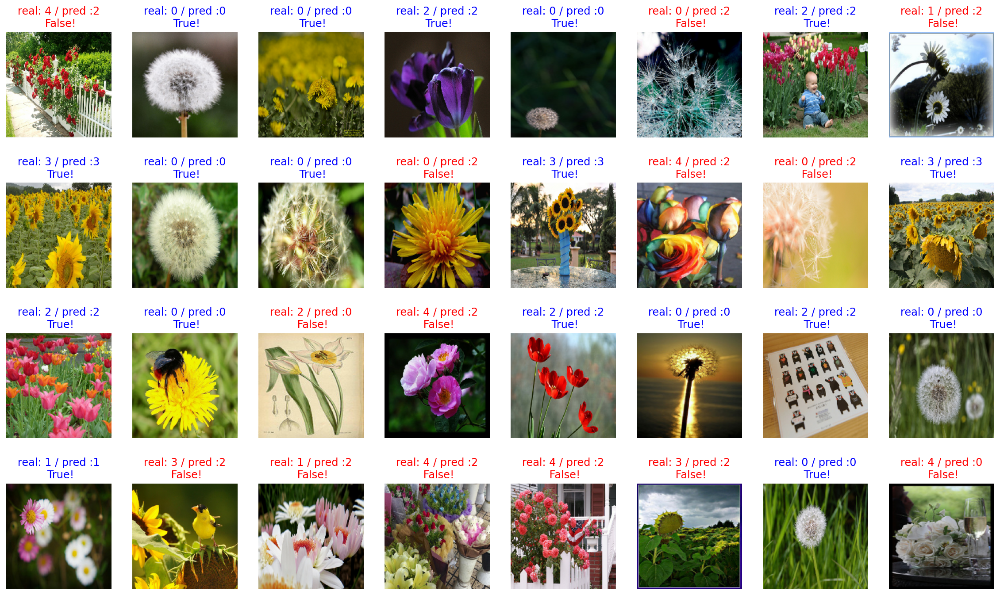

In [26]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [27]:
# 예측(prediction)의 정확도(accuracy) 갯수 구하기
    
count = 0   # 정답을 맞춘 개수

for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count= count + 1

print(count / 32 * 100)

56.25


# 사전 학습 모델인 VGG16을 가져오고, 모델의 구조 확인하기

In [28]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)  #IMG_SIZE = 180 # 리사이징할 이미지의 크기 (180,180,3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

58900480/58889256 [==============================] - 0s 0us/step


In [29]:
# 원래 사이즈를 확인(image_batch), 32는 이미지의 장수

image_batch.shape

TensorShape([32, 180, 180, 3])

In [30]:
# 이 벡터는 이미지에서 특징을 추출해 낸 "특징 벡터"라고 부르기도 합니다

feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [31]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 180, 180, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 180, 180, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 180, 180, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 90, 90, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 90, 90, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 90, 90, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 45, 45, 128)       0     

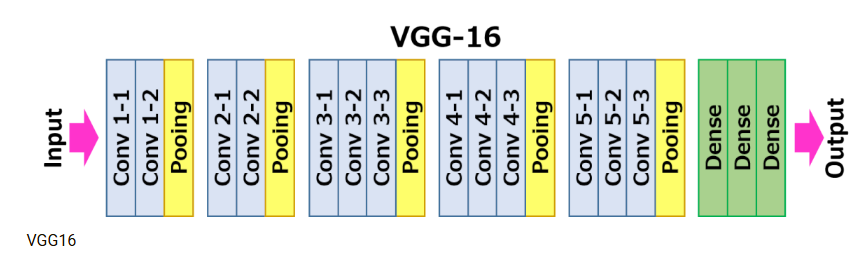

# VGG16 끝단에 classifier 레이어를 붙여서 원하는 구조의 분류 모델 만들기

In [91]:
feature_batch.shape

TensorShape([32, 5, 5, 512])

* Flattening 하는 것보다 조금 더 좋은 방법 -> Global Average Pooling

* 높은 차원을 다루려면 그 차원을 다룰 수 있는 많은수의 파라미터들을 필요로 합니다.
  - 하지만 파라미터가 너무 많아지면 학습 시 over fitting이 발생할 수 있는 문제가 발생하곤 합니다. 
  - 따라서 필터에 사용된 파라미터 수를 줄여서 차원을 감소시킬 방법이 필요합니다
  - 이런 역할을 CNN에서 해 주는 레이어가 pooling layer
  
* Global Average Pooling   (GAP)
  - Max(Average) Pooling 보다 더 급격하게 feature의 수를 줄입니다
  - 평균 값을 취하는 방법
  - feature의 모든 값들을 이용하면서 (평균) 하면서 feature의 크기를 줄여 차원을 감소시킵니다
  - GAP의 목적은 feature를 1차원 벡터로 만들기 위함입니다
  - GAP는 CNN + FC(Fully Connected) Layer에서 classifier인 FC Layer를 없애기 위한 방법으로 도입
  - GAP는 어떤 크기의 feature 라도 같은 채널의 값들을 하나의 평균 값으로 대체하기 때문에 벡터가 됩니다
  - 어떤 사이즈의 입력이 들어와도 상관이 없습니다
  -  (H, W, C) → (1, 1, C) 크기로 줄어드는 연산이므로, 파라미터가 추가되지 않으므로 학습 측면에서도 유리

In [32]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
#print("슝~")

In [33]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [34]:
dense_layer = Dense(512, activation='relu')
prediction_layer = Dense(5, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 5)


* 우리의 데이터들은 처음에 이미지에서 특징을 추출해 줄 VGG16, base_model에 입력되어 특징이 추출된 다음, 
* 그 특징 벡터는 global_average_layer를 거쳐 마지막에 prediction_layer까지 통과하며 5종의 꽃중 하나를 예측하게 될 것입니다.

In [35]:
base_model.trainable = False
#print("슝~")

In [36]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

#print("슝~")

In [37]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_3 (Dense)              (None, 5)                 2565      
Total params: 14,979,909
Trainable params: 265,221
Non-trainable params: 14,714,688
_________________________________________________________________


# VGG16을 기반 이미지 분류기 학습시키고, 직접 만들었던 모델과 결과 비교해 보기

In [38]:
base_learning_rate = 0.0001

model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [39]:
validation_steps=10
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

10/10 [==============================] - 6s 94ms/step - loss: 1.7558 - accuracy: 0.1437
initial loss: 1.76
initial accuracy: 0.14


In [41]:
EPOCHS = 20

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/20
92/92 [==============================] - 11s 109ms/step - loss: 0.6171 - accuracy: 0.8099 - val_loss: 0.5983 - val_accuracy: 0.8011
Epoch 2/20
92/92 [==============================] - 11s 112ms/step - loss: 0.5814 - accuracy: 0.8130 - val_loss: 0.5654 - val_accuracy: 0.8093
Epoch 3/20
92/92 [==============================] - 11s 114ms/step - loss: 0.5522 - accuracy: 0.8236 - val_loss: 0.5552 - val_accuracy: 0.8038
Epoch 4/20
92/92 [==============================] - 11s 116ms/step - loss: 0.5291 - accuracy: 0.8304 - val_loss: 0.5267 - val_accuracy: 0.8283
Epoch 5/20
92/92 [==============================] - 11s 114ms/step - loss: 0.5076 - accuracy: 0.8369 - val_loss: 0.5108 - val_accuracy: 0.8420
Epoch 6/20
92/92 [==============================] - 11s 113ms/step - loss: 0.4897 - accuracy: 0.8423 - val_loss: 0.5114 - val_accuracy: 0.8283
Epoch 7/20
92/92 [==============================] - 11s 111ms/step - loss: 0.4761 - accuracy: 0.8454 - val_loss: 0.4898 - val_accuracy: 0.8447

# 모델 학습 및 검증의 정확도 및  손실율 결과 시각화

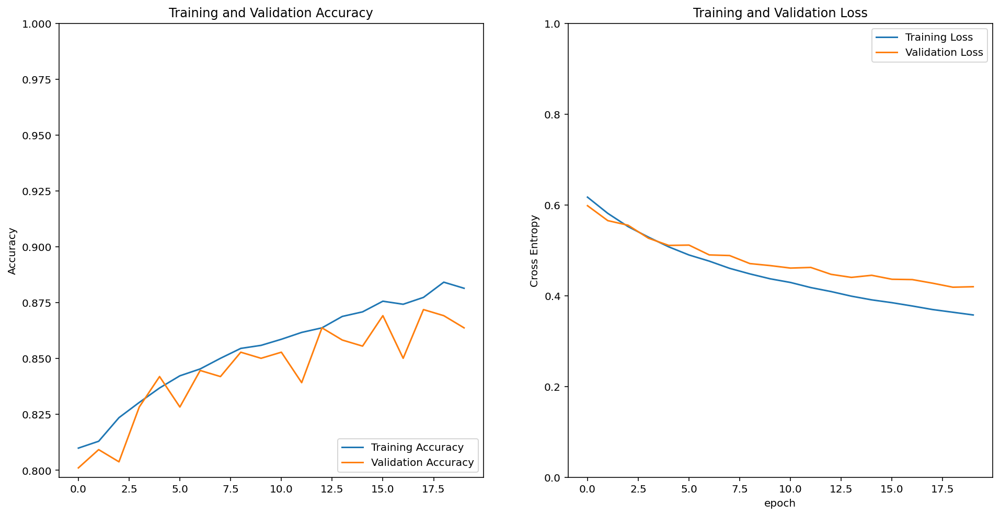

In [42]:
acc = history.history['accuracy']  #정확도(학습)
val_acc = history.history['val_accuracy']  #정확도(검증)

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)   # 학습/검증의 정확도비교
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)  #학습/검증의 손실율비교
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [43]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[8.31454806e-03, 3.48939523e-02, 8.45247388e-01, 1.62340365e-02,
        9.53100920e-02],
       [9.99839783e-01, 1.40055578e-04, 1.37547863e-06, 8.21202957e-06,
        1.06300859e-05],
       [7.11089015e-01, 1.02081925e-01, 1.49185453e-02, 1.51703477e-01,
        2.02069785e-02],
       [2.32848834e-04, 2.03246553e-03, 7.87686288e-01, 6.23778789e-04,
        2.09424555e-01],
       [7.55880058e-01, 2.10741714e-01, 8.79605021e-03, 9.63565055e-03,
        1.49465622e-02],
       [9.73420501e-01, 1.68813299e-02, 1.08869409e-03, 8.24966002e-03,
        3.59730126e-04],
       [2.89919227e-03, 3.05114873e-03, 9.43653643e-01, 1.02204094e-02,
        4.01756540e-02],
       [2.76164711e-01, 6.20104671e-01, 4.77615715e-04, 1.01582587e-01,
        1.67036301e-03],
       [4.71575838e-03, 1.03733188e-03, 1.32590318e-02, 9.38081264e-01,
        4.29066718e-02],
       [9.99762595e-01, 2.23290102e-04, 5.93357868e-07, 1.16672636e-05,
        1.77396851e-06],
       [9.72077072e-01, 2.5401

In [44]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 2, 0, 0, 2, 1, 3, 0, 0, 3, 3, 4, 0, 3, 2, 0, 2, 4, 2, 0,
       1, 0, 1, 3, 2, 4, 4, 3, 0, 4])

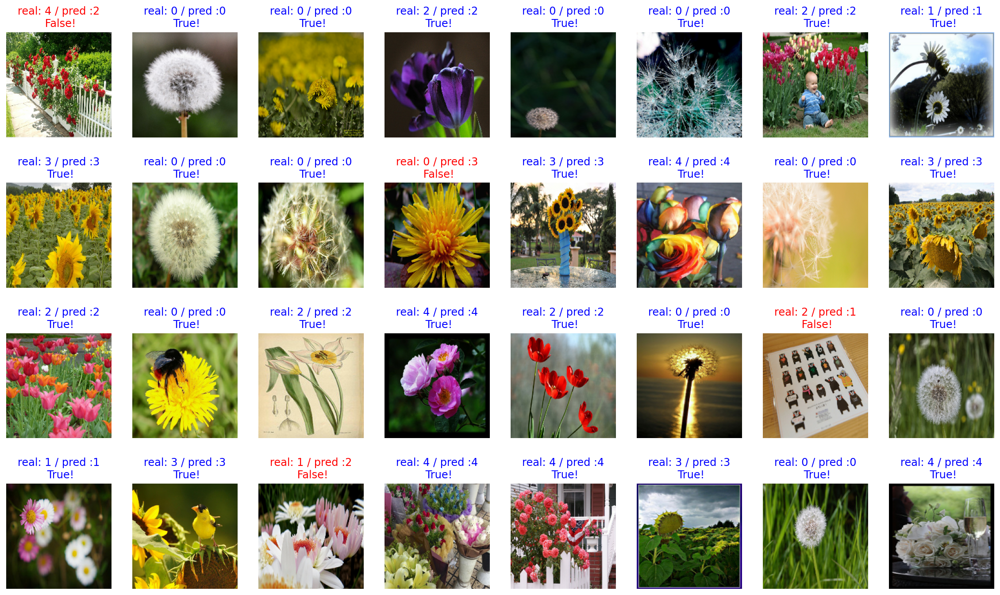

In [45]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [46]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 84% 내외

87.5


# 모델을 save 하고, 다시 load 해와서 사용하는 방법 익히기

In [47]:
!mkdir -p ~/aiffel/tf_flowers_load/checkpoint
!mkdir -p ~/aiffel/tf_flowers_load/images

In [48]:
import os

checkpoint_dir = os.getenv("HOME") + "/aiffel/tf_flowers_load/checkpoint"
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')
    
model.save_weights(checkpoint_file_path)     # checkpoint 파일 생성

if os.path.exists(checkpoint_file_path):
  print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!


# 학습된 모델에 원하는 이미지를 입력해 예측 결과 확인해 보기

In [65]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [66]:
IMG_SIZE = 180
img_dir_path = os.getenv("HOME") + "/aiffel/tf_flowers_load/images"
print(img_dir_path)

/aiffel/aiffel/tf_flowers_load/images


In [92]:
def show_and_predict_image(dirpath, filename, img_size=180):
    filepath = os.path.join(dirpath, filename)
    print(f"filepath: {filepath}")
    
    image = load_img(filepath, target_size=(img_size, img_size)) #target_size 크기로 이미지로딩
    plt.imshow(image)
    plt.axis('off')
    
    image = img_to_array(image).reshape(1, img_size, img_size, 3)  #모델에 넣을 수 있도록 이미지를 array, 즉 배열 자료형으로 변환
    prediction = model.predict(image)[0]  #모델예측
    #print(prediction)
    
    dandelion_percentage = round(prediction[0] * 100)
    daisy_percentage = round(prediction[1] * 100)
    tulips_percentage = round(prediction[2] * 100)
    sunflowers_percentage = round(prediction[3] * 100)
    roses_percentage = round(prediction[4] * 100)
    
    print(str(dandelion_percentage)+':민',str(daisy_percentage)+':데',str(tulips_percentage)+':튤',str(sunflowers_percentage)+':해',str(roses_percentage)+':장')
    
    #0: dandelion(민들레), 1:daisy(데이지), 2:tulips(튤립), 3:sunflowers(해바라기), 4:roses(장미)
    
    if dandelion_percentage > 0:
        print(f"This image seems {dandelion_percentage}% dandelion(민들레) ")
    elif daisy_percentage > 0:
        print(f"This image seems {daisy_percentage}% daisy(데이지) ")
    elif tulips_percentage > 0:
        print(f"This image seems {tulips_percentage}% tulips(튤립) ")
    elif sunflowers_percentage > 0:
        print(f"This image seems {sunflowers_percentage}% sunflowers(해바라기) ")
    elif roses_percentage > 0:
        print(f"This image seems {roses_percentage}% roses(장미) ")
    else:
        print("자료를 확인하세요.")
    
    #print(f"This image seems {dandelion_percentage}% dandelion(민들레), and {daisy_percentage}% daisy(데이지), and {tulips_percentage}% tulips(튤립), and {sunflowers_percentage}% sunflowers(해바라기), and {roses_percentage}% roses(장미).")

filepath: /aiffel/aiffel/tf_flowers_load/images/10.jpg
0:민 0:데 0 0 100
This image seems 100% roses(장미) 


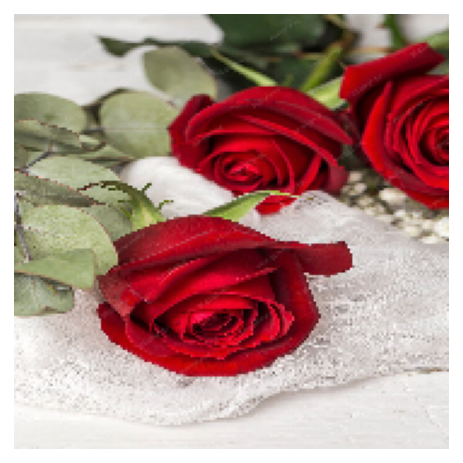

In [93]:
#filename만 바꾸어 원하는대로 실험가능

filename = '10.jpg'

show_and_predict_image(img_dir_path, filename)  #img_dir_path=/aiffel/aiffel/cat_vs_dog/images, filename=my_dog.jpg

filepath: /aiffel/aiffel/tf_flowers_load/images/11.jpg
100 0 0 0 0 / 민,데,튤,해,장
This image seems 100% dandelion(민들레) 


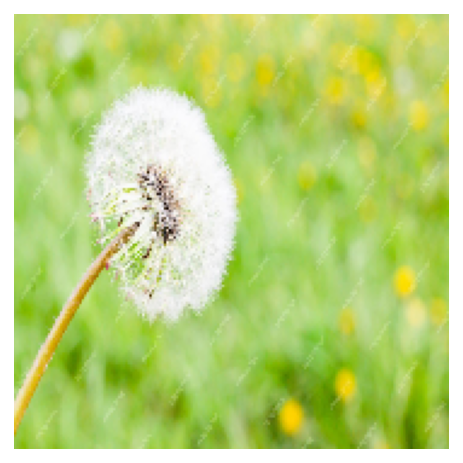

In [85]:
filename = '11.jpg'

show_and_predict_image(img_dir_path, filename)

filepath: /aiffel/aiffel/tf_flowers_load/images/12.jpg
0 0 100 0 0 / 민,데,튤,해,장
This image seems 100% tulips(튤립) 


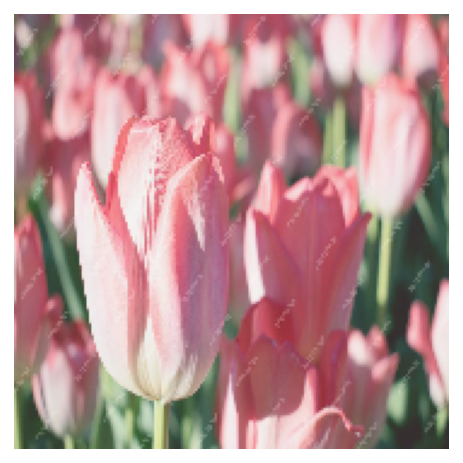

In [86]:
filename = "12.jpg"
show_and_predict_image(img_dir_path, filename)

filepath: /aiffel/aiffel/tf_flowers_load/images/13.jpg
0 100 0 0 0 / 민,데,튤,해,장
This image seems 100% daisy(데이지) 


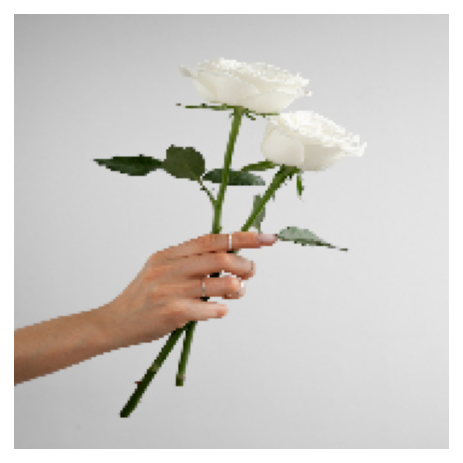

In [87]:
filename = "13.jpg"
show_and_predict_image(img_dir_path, filename)

filepath: /aiffel/aiffel/tf_flowers_load/images/14.jpg
0 0 100 0 0 / 민,데,튤,해,장
This image seems 100% tulips(튤립) 


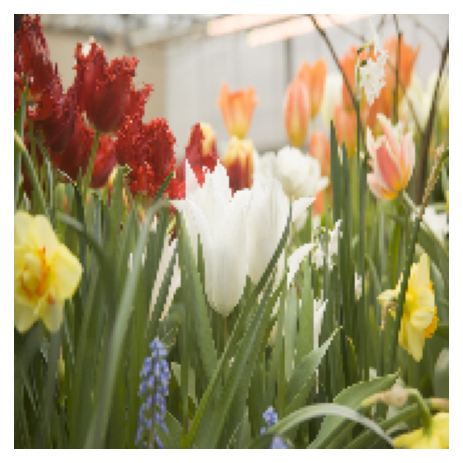

In [88]:
filename = "14.jpg"
show_and_predict_image(img_dir_path, filename)

filepath: /aiffel/aiffel/tf_flowers_load/images/15.jpg
0 100 0 0 0 / 민,데,튤,해,장
This image seems 100% daisy(데이지) 


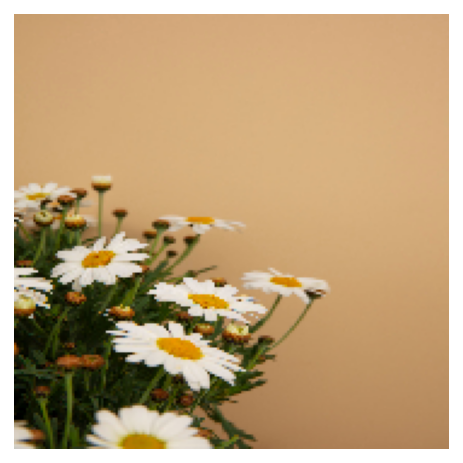

In [89]:
filename = "15.jpg"
show_and_predict_image(img_dir_path, filename)

filepath: /aiffel/aiffel/tf_flowers_load/images/16.jpg
This image seems 100% sunflowers(해바라기) 


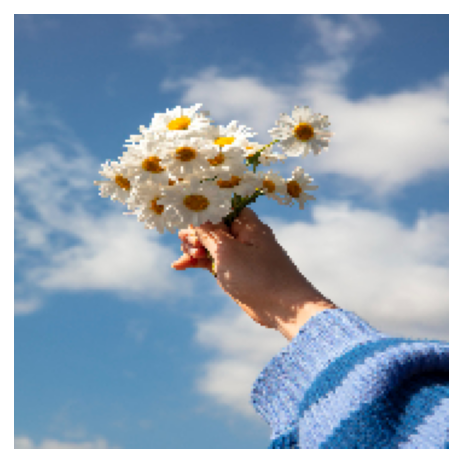

In [74]:
filename = "16.jpg"
show_and_predict_image(img_dir_path, filename)

filepath: /aiffel/aiffel/tf_flowers_load/images/17.jpg
This image seems 100% sunflowers(해바라기) 


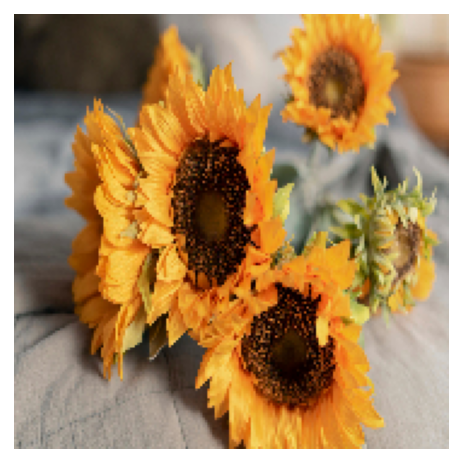

In [75]:
filename = "17.jpg"
show_and_predict_image(img_dir_path, filename)

filepath: /aiffel/aiffel/tf_flowers_load/images/18.jpg
This image seems 100% sunflowers(해바라기) 


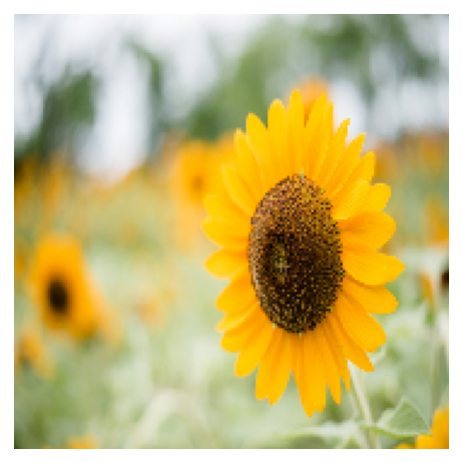

In [76]:
filename = "18.jpg"
show_and_predict_image(img_dir_path, filename)